# Image preparation


In [1]:
import os
import numpy as np
from PIL import Image
from functions.food_classifier_plotting_functions import plot_accuracy_loss, plot_predictions_or_examples, plot_confusion_matrix
from functions.split_images import split_images
from functions.my_image_data_generator import my_image_data_generator
from functions.correct_predictions import correct_predictions
from functions.my_sequential import my_sequential
from functions import my_scraper
%matplotlib inline

Using TensorFlow backend.


Some images may have been saved with the wrong extension.

In [2]:
root_dir ='data_food_classifier_MG'
root_listdir = os.listdir(root_dir)
counter = 0

for index, element in enumerate(root_listdir):
    filename = root_dir + '/' + element
    try:
        im = Image.open(filename)
        im.verify() #I perform also verify, don't know if he sees other types o defects
        im.close() #reload is necessary in my case
    except (OSError, ValueError):
        os.remove(filename)
        root_listdir[index] = 0
        counter += 1

print('%d files deleted due to OSError and  ValueError.' %counter)

7 files deleted due to OSError and  ValueError.


Splitting images into train, test and valid sets.

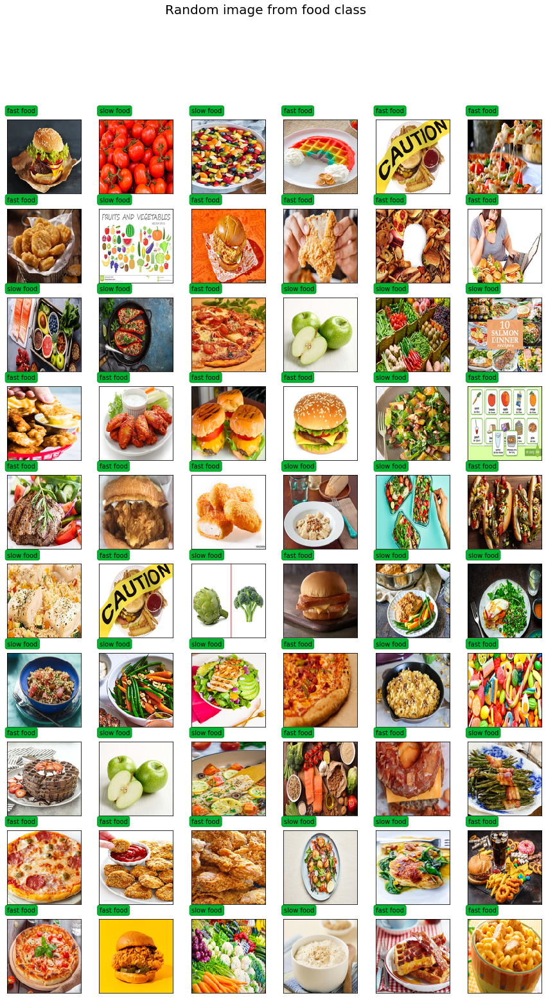

In [3]:
root_listdir = [i for i in root_listdir if i != 0]
list_of_images_indices = np.random.choice(len(root_listdir), 60)
list_of_images_names = [root_listdir[i] for i in list_of_images_indices]

plot_predictions_or_examples(list_of_images_names, title="Random image from food class")

In [4]:
fast_food_list = [i for i in root_listdir if 'fast_food' in i]
slow_food_list = [i for i in root_listdir if 'slow_food' in i]

train_examples_fast, valid_examples_fast, test_examples_fast = split_images(fast_food_list, root_dir, '/fast_food/')
train_examples_slow, valid_examples_slow, test_examples_slow = split_images(slow_food_list, root_dir, '/slow_food/')

train_examples = train_examples_fast + train_examples_slow
valid_examples = valid_examples_fast + valid_examples_slow
test_examples = test_examples_fast + test_examples_slow

# Classification models

In [5]:
%load_ext tensorboard

import tensorflow as tf
import keras
import random
import itertools
import datetime

from sklearn.metrics import confusion_matrix

from keras.preprocessing.image import ImageDataGenerator
from keras import applications, backend as K
from keras.models import  Model
from keras.layers import (
    Dense,
    Activation,
    Conv2D,
    MaxPool2D,
    Flatten,
    BatchNormalization,
    Dropout,
)
from keras.layers.core import Dense, Flatten
from keras.layers.normalization import BatchNormalization
from keras.optimizers import Adam, RMSprop
from keras.metrics import categorical_crossentropy
from keras_lr_finder import LRFinder
from keras.callbacks import TensorBoard

In [6]:
channels = 3
img_height = img_width = 224
batch_size = 32

train_folder = root_dir + "/train"
test_folder = root_dir + "/test"
valid_folder = root_dir + "/valid"

classes = ["slow_food", "fast_food"]

## Logistic regression

First attempt should be simple so we will check Logistic Regression on our data.

In [7]:
train_generator = my_image_data_generator(
    train_folder, class_mode="binary", shuffle=True
)
test_generator = my_image_data_generator(test_folder, class_mode="binary", shuffle=True)

x_train, y_train = next(train_generator)
x_test, y_test = next(test_generator)

Found 1665 images belonging to 2 classes.
Found 356 images belonging to 2 classes.


In [8]:
from sklearn.linear_model import LogisticRegression

logistic = LogisticRegression(solver="liblinear")
logistic.fit(x_train.reshape(batch_size, -1), y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='liblinear', tol=0.0001, verbose=0,
                   warm_start=False)

In [9]:
y_pred = logistic.predict(x_test.reshape(len(x_test), -1))
np.count_nonzero(y_pred == y_test) / len(y_test)

0.625

Model accuracy is not satisfactory.

## Build Fine-tuned VGG16 model

Now we will try to use pretrained model VGG16. The model achieves 92.7% top-5 test accuracy in ImageNet, which is a dataset of over 14 million images belonging to 1000 classes.


In [10]:
K.clear_session()
vgg16_model = applications.vgg16.VGG16()
vgg16_model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

In [11]:
model = my_sequential()
for layer in vgg16_model.layers[:-3]:
    model.add(layer)

We should pop dense layers.

In [12]:
for layer in model.layers:
    layer.trainable = False

model.add(Dense(2, activation="sigmoid"))
model.summary()

Model: "my_sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
_________________________________________________________________
block3_conv1 (Conv2D)        (None, 56, 56, 256)   

In [13]:
train_batches = my_image_data_generator(train_folder, batch_size=10, classes=classes)
test_batches = my_image_data_generator(test_folder, batch_size=10, classes=classes)
valid_batches = my_image_data_generator(valid_folder, batch_size=4, classes=classes)

Found 1665 images belonging to 2 classes.
Found 356 images belonging to 2 classes.
Found 358 images belonging to 2 classes.


## Train the fine-tuned VGG16 model

In [14]:
model.compile(Adam(lr=0.001), loss="categorical_crossentropy", metrics=["accuracy"])

history = model.fit_generator(
    train_batches,
    train_examples // 10,
    validation_data=valid_batches,
    validation_steps=valid_examples // 4 + 1,
    epochs=5,
    verbose=2,
)

predictions = model.predict_generator(test_batches, test_examples // 10)

Epoch 1/5
 - 357s - loss: 0.7830 - accuracy: 0.5033 - val_loss: 0.6931 - val_accuracy: 0.5112
Epoch 2/5
 - 335s - loss: 0.6931 - accuracy: 0.5148 - val_loss: 0.6931 - val_accuracy: 0.5084
Epoch 3/5
 - 380s - loss: 0.6931 - accuracy: 0.4979 - val_loss: 0.6931 - val_accuracy: 0.5084
Epoch 4/5
 - 349s - loss: 0.6931 - accuracy: 0.5027 - val_loss: 0.6931 - val_accuracy: 0.5084
Epoch 5/5
 - 336s - loss: 0.6931 - accuracy: 0.5021 - val_loss: 0.6931 - val_accuracy: 0.5084


In [15]:
predictions = model.predict_generator(test_batches, test_examples // 10)
correct_predictions(test_batches, predictions)

Correct predictions: 0.4747191011235955


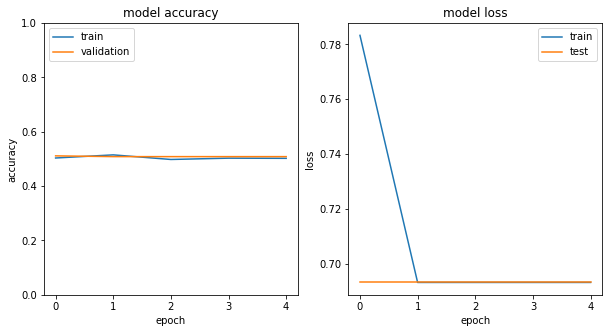

In [16]:
plot_accuracy_loss(history)

In [17]:
c = list(
    zip(
        [i.split("\\")[1] for i in test_batches.filenames],
        [1 if i[0] >= 0.5 else 0 for i in predictions],
    )
)
random.shuffle(c)

filenames, preds = zip(*c)

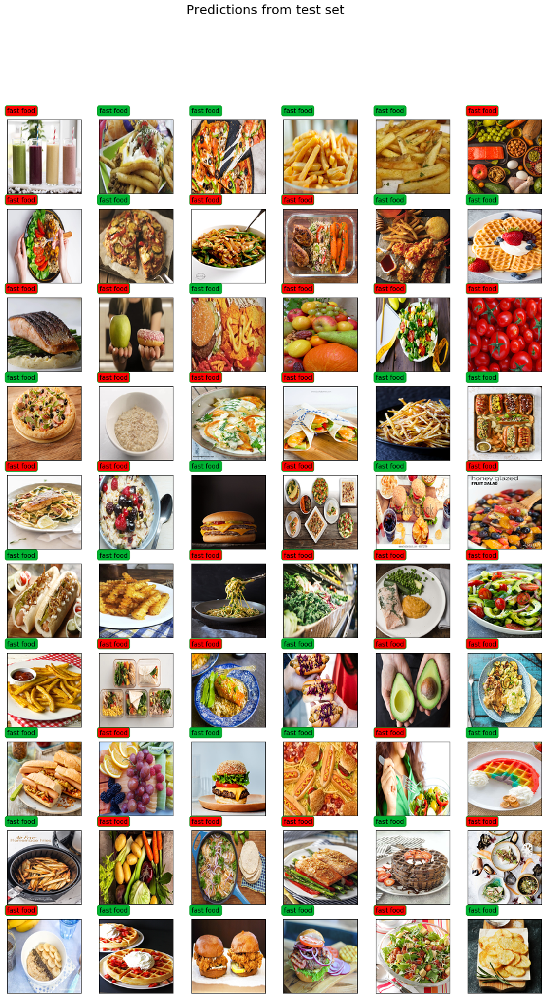

In [18]:
wrong_predictions = plot_predictions_or_examples(filenames, preds)

In [19]:
wrong_predictions

['slow_food 88.how-to-make-a-fruit-smoothie-10.jpg',
 'slow_food 3.paleo-diet-foods-getty.jpg',
 'slow_food 14.https%3A%2F%2Fprod.static9.net.au%2F_%2Fmedia%2F2018%2F10%2F16%2F13%2F02%2Fhealthy_plate.jpg',
 'slow_food 44.Green-Beans-closeup2.jpg',
 'slow_food 85.turkey-kebab-meal-prep.jpg',
 'slow_food 88.BFV28280EasySalmonDinnervsGourmetSalmonDinnerFBV4.jpg',
 'slow_food 77.1568339804709.jpg',
 'slow_food 75.Natural_foodstuff_004.JPG',
 'slow_food 25.diet-625-625x350-71438688977-1493182653.jpg',
 'slow_food 85.2962762666_1237ff6eb4_o.jpg',
 'slow_food 6.img25020.768x512.jpg',
 'slow_food 57.creamy-spinach-and-artichoke-chicken-1.jpg',
 'slow_food 61.sweet-chili-fish-wrap-1.jpg',
 'slow_food 40.3262db94c95bede83b1c14d7e45adc60.jpg',
 'slow_food 9.Seven-grain-porridge-LGH-2be12108-b3ab-48a4-b07a-b87770754a92-0-1400x919.jpg',
 'slow_food 31.background.jpg',
 'slow_food 61.Honey-Glazed-Fruit-Salad-Family-Fresh-Meals-Recipe.jpg',
 'slow_food 36.Califlower-Pasta-100-2.jpg',
 'slow_food 83.s

In [20]:
test_labels = np.array([0 if "slow_food" in f else 1 for f in test_batches.filenames])[
    : len(predictions)
]
cm = confusion_matrix(test_labels, np.round(predictions[:, 0]))

Confusion matrix, without normalization
[[  0 181]
 [  0 169]]


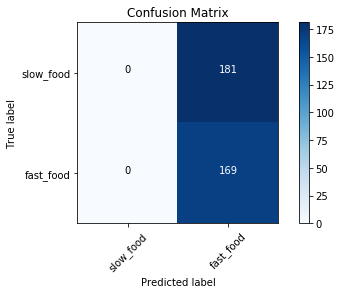

In [21]:
plot_confusion_matrix(cm, classes, title="Confusion Matrix")

Model is much worse than previous ones. It means that simple model won't be enough, because we don't have big dataset.

# Sequential model


Pretrained model didn't pass the exam. Now we will try create our own model.


In [22]:
K.clear_session()
model = my_sequential()

model.add(
    Conv2D(
        8,
        kernel_size=(3, 3),
        padding="same",
        input_shape=(img_width, img_height, channels),
    )
)
model.add(Activation("relu"))
model.add(MaxPool2D(pool_size=(2, 2)))

model.add(Conv2D(16, kernel_size=(3, 3), padding="same"))
model.add(BatchNormalization())
model.add(Activation("relu"))
model.add(MaxPool2D(pool_size=(2, 2)))

model.add(Conv2D(32, kernel_size=(3, 3), padding="same"))
model.add(BatchNormalization())
model.add(Activation("relu"))
model.add(MaxPool2D(pool_size=(2, 2)))

model.add(Flatten())
model.add(Dense(2, activation="sigmoid"))
model.compile(optimizer="rmsprop", loss="binary_crossentropy", metrics=["accuracy"])
model.summary()


Model: "my_sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 224, 224, 8)       224       
_________________________________________________________________
activation_1 (Activation)    (None, 224, 224, 8)       0         
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 112, 112, 8)       0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 112, 112, 16)      1168      
_________________________________________________________________
batch_normalization_1 (Batch (None, 112, 112, 16)      64        
_________________________________________________________________
activation_2 (Activation)    (None, 112, 112, 16)      0         
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 56, 56, 16)    

In [23]:
train_batches = my_image_data_generator(
    train_folder, classes=classes, shuffle=True
)
test_batches = my_image_data_generator(test_folder, classes=classes)

Found 1665 images belonging to 2 classes.
Found 356 images belonging to 2 classes.


In [24]:
model.fit_generator(train_batches, train_examples // batch_size, epochs=2)

Epoch 1/2
52/52 [==============================] - 61s 1s/step - loss: 2.3626 - accuracy: 0.6739
Epoch 2/2
52/52 [==============================] - 65s 1s/step - loss: 1.3734 - accuracy: 0.7376


In [25]:
y_pred = model.predict_generator(test_batches, test_examples // batch_size, workers=4)
correct_predictions(test_batches, y_pred)

Correct predictions: 0.4438202247191011


In [26]:
c = list(
    zip(
        [i.split("\\")[1] for i in test_batches.filenames],
        [1 if i[0] >= 0.5 else 0 for i in y_pred],
    )
)
random.shuffle(c)

filenames_2, preds_2 = zip(*c)

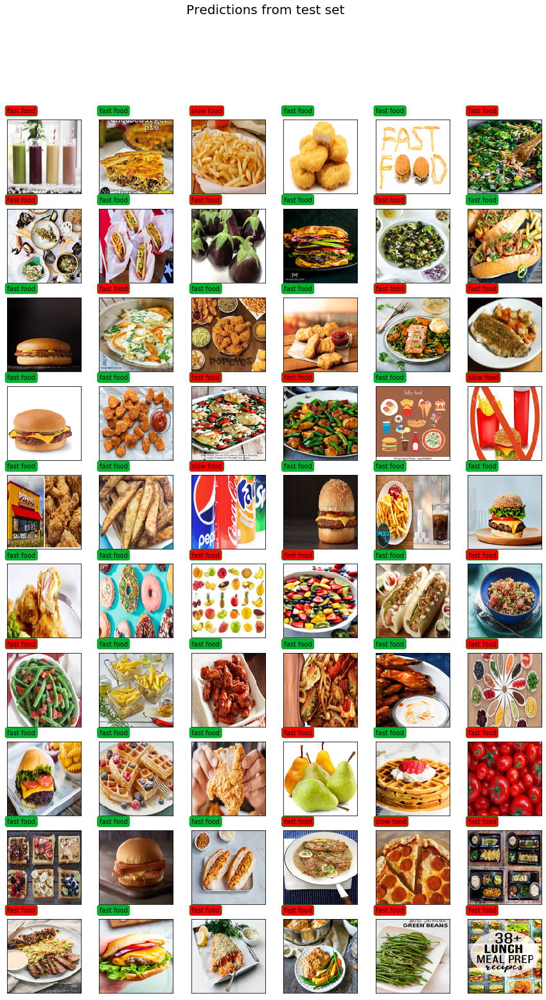

In [27]:
wrong_predictions_2 = plot_predictions_or_examples(filenames_2, preds_2)

In [28]:
wrong_predictions_2

['slow_food 88.how-to-make-a-fruit-smoothie-10.jpg',
 'fast_food 9.shoestringfries-jpg-507423-1.jpg',
 'slow_food 32.healthy-kale-brocoli-salad-lemon-dressing-recipe-.jpg',
 'slow_food 74.seafood-meal-on-ice-EJ.jpg',
 'slow_food 57.OPTeggplant-1.jpg',
 'slow_food 94.broccoli-crunch-salad-I-howsweeteats.com-8.jpg',
 'slow_food 57.creamy-spinach-and-artichoke-chicken-1.jpg',
 'slow_food 11.salmon-resized-6.jpg',
 'slow_food 86.20110904-127355-dinner-tonight-whitefish-breadcrumbs.jpg',
 'slow_food 49.1-text-650-Greek-chicken-green-beans-tomatoes-sheeet-pan-meal-1-600x900.jpg',
 'slow_food 2.chicken-and-green-beans-4.jpg',
 'fast_food 11.uToUfYgVZjBaGwz-800x450-noPad.jpg',
 'fast_food 52.060616_endorsements_THUMB_LARGE.jpg',
 'slow_food 9.fruits-compressor.jpg',
 'slow_food 72.Fruit-Salad-Honey-Lime-Dressing-IMAGES-223.jpg',
 'slow_food 60.grainsaladwithtoastedwalnutsdatesandgrapefruit15643891381564389150.jpg',
 'slow_food 32.Italian-Green-Beans-and-Tomatoes-Recipe.jpg',
 'slow_food 39.150

In [29]:
test_labels = np.array([0 if "slow_food" in f else 1 for f in test_batches.filenames])[
    : len(y_pred)
]
cm = confusion_matrix(test_labels, np.round(y_pred[:, 0]))

Confusion matrix, without normalization
[[  0 181]
 [ 13 158]]


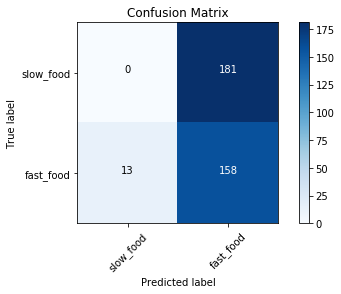

In [30]:
plot_confusion_matrix(cm, classes, title="Confusion Matrix")

Model still is much worse than linear regression.


## Transfer learning

Last attempt is transfer learning. We will use VGG16 again but this time in other way.


In [31]:
K.clear_session()
train_batches_1 = my_image_data_generator(train_folder, class_mode=None)
train_batches_2 = my_image_data_generator(train_folder, class_mode=None)
valid_batches = my_image_data_generator(valid_folder, class_mode=None)
test_batches = my_image_data_generator(test_folder, class_mode="binary")

Found 1665 images belonging to 2 classes.
Found 1665 images belonging to 2 classes.
Found 358 images belonging to 2 classes.
Found 356 images belonging to 2 classes.


In [32]:
model = applications.VGG16(include_top=False, weights="imagenet")
model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, None, None, 3)     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, None, None, 64)    1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, None, None, 64)    36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, None, None, 64)    0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, None, None, 128)   73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, None, None, 128)   147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, None, None, 128)   0     

Training VGG16 on our data should give us the bottleneks of our images. In this case we will use VGG16 predictions to train our sequential model. It means that we changed sets of images into sets of bottlenecks which could be more helpful in detecting category.


In [33]:
bottleneck_features_train = model.predict_generator(
    train_batches_1, train_examples // batch_size, verbose=1, workers=4
)
bottleneck_features_valid = model.predict_generator(
    valid_batches, test_examples // batch_size, verbose=1, workers=4
)
bottleneck_features_test = model.predict_generator(
    test_batches, test_examples // batch_size, verbose=1, workers=4
)

bottleneck_features_train.shape


11/11 [==============================] - 61s 6s/step


(1664, 7, 7, 512)

In [34]:
model = my_sequential()
model.add(Flatten(input_shape=bottleneck_features_train.shape[1:]))
model.add(Dense(256, activation="relu"))
model.add(Dropout(0.5))
model.add(Dense(1, activation="sigmoid"))

for layer in model.layers[:-1]:
    layer.trainable = False

model.compile(
    optimizer=RMSprop(learning_rate=0.01, rho=0.9),
    loss="binary_crossentropy",
    metrics=["accuracy"],
)

log_dir = os.path.join(
    "logs",
    "fit",
    datetime.datetime.now().strftime("%Y%m%d-%H%M%S"),
)
tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1)

model.summary()

Model: "my_sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_1 (Flatten)          (None, 25088)             0         
_________________________________________________________________
dense_1 (Dense)              (None, 256)               6422784   
_________________________________________________________________
dropout_1 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 257       
Total params: 6,423,041
Trainable params: 257
Non-trainable params: 6,422,784
_________________________________________________________________


In [35]:
labels = np.array([0 if "slow_food" in f else 1 for f in train_batches_2.filenames])[
    : len(bottleneck_features_train)
]
val_labels = np.array([0 if "slow_food" in f else 1 for f in valid_batches.filenames])[
    : len(bottleneck_features_valid)
]

Epoch 1/20
1664/1664 [==============================] - 0s 217us/step - loss: 0.8272 - accuracy: 0.4561
Epoch 2/20
1664/1664 [==============================] - 0s 170us/step - loss: 0.8138 - accuracy: 0.4802
Epoch 3/20
1664/1664 [==============================] - 0s 161us/step - loss: 0.8129 - accuracy: 0.4669
Epoch 4/20
1664/1664 [==============================] - 0s 169us/step - loss: 0.7981 - accuracy: 0.4814
Epoch 5/20
1664/1664 [==============================] - 0s 158us/step - loss: 0.8161 - accuracy: 0.4615
Epoch 6/20
1664/1664 [==============================] - 0s 137us/step - loss: 0.8120 - accuracy: 0.45970s - loss: 0.8089 - accuracy: 0.
Epoch 7/20
1664/1664 [==============================] - 0s 141us/step - loss: 0.8087 - accuracy: 0.4736
Epoch 8/20
1664/1664 [==============================] - 0s 140us/step - loss: 0.7856 - accuracy: 0.4910
Epoch 9/20
1664/1664 [==============================] - 0s 138us/step - loss: 0.7999 - accuracy: 0.4706
Epoch 10/20
1664/1664 [=========

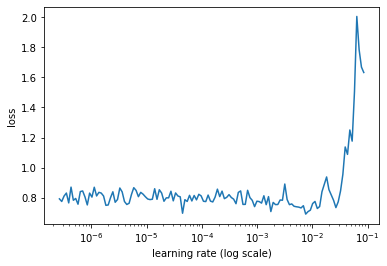

In [36]:
lr_finder = LRFinder(model)
lr_finder.find(bottleneck_features_train, labels, 0.0000001, 1, 200, 20)
lr_finder.plot_loss()

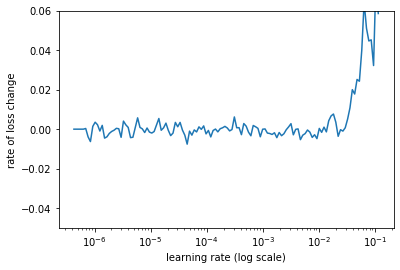

In [37]:
lr_finder.plot_loss_change(
    sma=20, n_skip_beginning=15, n_skip_end=2, y_lim=(-0.05, 0.06)
)

In [38]:
model.fit(
    bottleneck_features_train,
    labels,
    validation_data=(bottleneck_features_valid[: len(val_labels)], val_labels),
    epochs=20,
    batch_size=batch_size,
)
for layer in model.layers[:-1]:
    layer.trainable = True

model.compile(
    optimizer=RMSprop(learning_rate=0.001, rho=0.9),
    loss="binary_crossentropy",
    metrics=["accuracy"],
)

history_2 = model.fit(
    bottleneck_features_train,
    labels,
    validation_data=(bottleneck_features_valid[: len(val_labels)], val_labels),
    epochs=20,
    batch_size=batch_size,
    callbacks=[tensorboard_callback],
)

Train on 1664 samples, validate on 352 samples
Epoch 1/20
1664/1664 [==============================] - 1s 333us/step - loss: 0.7512 - accuracy: 0.5036 - val_loss: 0.7040 - val_accuracy: 0.5057
Epoch 2/20
1664/1664 [==============================] - 1s 303us/step - loss: 0.6676 - accuracy: 0.6118 - val_loss: 0.6026 - val_accuracy: 0.7017
Epoch 3/20
1664/1664 [==============================] - 1s 303us/step - loss: 0.6389 - accuracy: 0.6394 - val_loss: 0.6194 - val_accuracy: 0.6193
Epoch 4/20
1664/1664 [==============================] - 1s 306us/step - loss: 0.6354 - accuracy: 0.6406 - val_loss: 0.5723 - val_accuracy: 0.7017
Epoch 5/20
1664/1664 [==============================] - 1s 303us/step - loss: 0.6436 - accuracy: 0.6358 - val_loss: 0.5760 - val_accuracy: 0.7074
Epoch 6/20
1664/1664 [==============================] - 1s 351us/step - loss: 0.6372 - accuracy: 0.6394 - val_loss: 0.5683 - val_accuracy: 0.7472
Epoch 7/20
1664/1664 [==============================] - 1s 357us/step - loss:

In [39]:
test_labels = np.array([0 if "slow_food" in f else 1 for f in test_batches.filenames])[
    : len(bottleneck_features_test)
]
y_test_pred = model.predict_classes(bottleneck_features_test)
accuracy = np.count_nonzero(
    y_test_pred[: len(test_labels)].ravel() == test_labels
) / len(test_labels)

print("\nThe accuracy is: " + str(accuracy))


The accuracy is: 0.8238636363636364


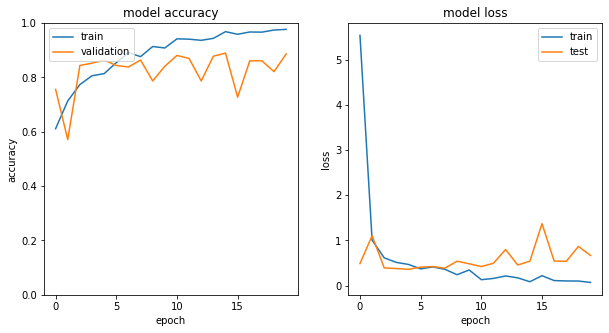

In [40]:
plot_accuracy_loss(history_2)

This model is the most promising one.

In [41]:
cm = confusion_matrix(test_labels, np.round(y_test_pred[: len(test_labels)]))

Confusion matrix, without normalization
[[145  32]
 [ 30 145]]


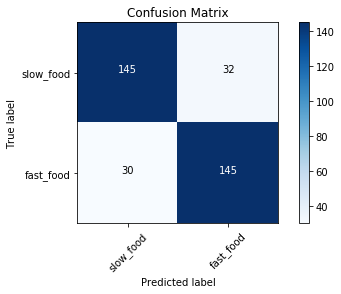

In [42]:
plot_confusion_matrix(cm, classes, title="Confusion Matrix")

Normalized confusion matrix
[[0.81920904 0.18079096]
 [0.17142857 0.82857143]]


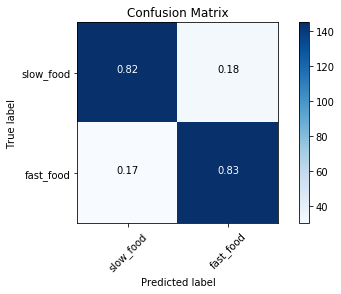

In [43]:
plot_confusion_matrix(cm, classes, title="Confusion Matrix", normalize=True)

Prediction on the test set are also much more accurate thane previous ones.

In [44]:
c = list(zip([i.split("\\")[1] for i in test_batches.filenames], y_test_pred))
random.shuffle(c)

filenames_3, preds_3 = zip(*c)

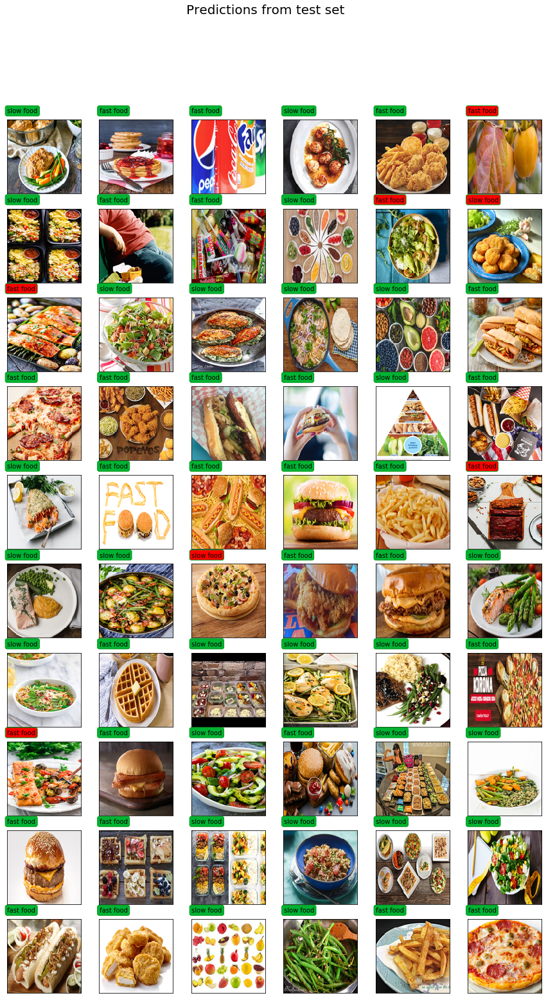

In [45]:
wrong_predictions_3 = plot_predictions_or_examples(filenames_3, preds_3)

In [46]:
wrong_predictions_3

['slow_food 41.iStock-916071874-PERSIMMON.jpg',
 'slow_food 13.tarragon-pesto-e1526480069676-920x703.jpg',
 'fast_food 80.109052.jpg',
 'slow_food 54.Sheet-Pan-Salmon-Dinner-5-copy.jpg',
 'slow_food 88.DELICIOUS-Vegan-Lentil-22Meatloaf22-Recipe-10-ingredients-super-satisfying-BIG-flavor-glutenfree-meatloaf-dinner-vegan-lentil-minimalistbaker-recipe-8.jpg',
 'fast_food 14.banner_nmenu.jpg',
 'slow_food 38.teriyaki-salmon-sheet-pan-dinner-1.jpg']

## Tensorboard

In [47]:
from tensorboard import notebook
notebook.list() # View open TensorBoard instances

Known TensorBoard instances:
  - port 6006: logdir logs/fit (started 1 day, 4:56:24 ago; pid 21392)


In [54]:
tf.compat.v1.reset_default_graph()

In [55]:
notebook.display(port=6006, height=1000) 

Selecting TensorBoard with logdir logs/fit (started 1 day, 5:11:12 ago; port 6006, pid 21392).
